# Training YOLO v11 Models in Google Colab

This notebook utilizes [Ultralytics](https://docs.ultralytics.com/) to train a YOLOv11n object detection model on a custom dataset.
By the end of this notebook, you will have a trained YOLO model ready to deploy on various platforms, including your PC, smartphone, or edge devices such as the SAMA7D65 Curiosity board.


### Working in Colab
Google Colab provides a cloud-based development environment with a full Linux OS, preconfigured Python ecosystem, and access to GPU acceleration. This makes it ideal for training deep learning models without requiring local compute resources. All training will be performed using PyTorch and Ultralytics, with support for exporting models to ONNX or TFLite formats for edge deployment.

### Notebook Navigation
Use the left-hand table of contents for quick access to different sections such as environment setup, dataset preparation, training, evaluation, and deployment/export workflows.


**Verify GPU Availability**

To ensure optimal training performance, confirm that your runtime is configured to use a GPU:

1.Navigate to Runtime → Change runtime type in the Colab menu bar.

2.Under Hardware accelerator, select GPU.

3.Click Save to apply the changes.

Then, execute the following code cell to verify that an NVIDIA GPU is available and properly recognized by the environment.

A successful configuration will display the GPU model, driver version, and memory status. This step is essential for accelerated model training using PyTorch and Ultralytics.




In [ ]:
!nvidia-smi

Tue May 27 15:06:59 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   66C    P8             12W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# 1.&nbsp;Install Required Packages (Ultralytics)
In this step, we’ll install the Ultralytics library into the current Colab environment. This library provides a high-level API for training and deploying YOLO models efficiently. It includes built-in support for training, validation, export, and deployment to a variety of platforms.

Run the following code block to install Ultralytics and its dependencies

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 27.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 119.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 91.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 80.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

# 2.&nbsp;Upload Dataset and Prepare for Training

In this step, we will upload the custom image dataset and organize it for use with YOLO training workflows. This includes:

1.Upload the Dataset

2.Splitting the dataset into training and validation sets

3.Structuring the directories according to YOLO format


This setup ensures that the dataset is correctly formatted and ready for training with YOLOv11.



## 2.1 Upload images

First, we need to upload the dataset to Colab. Here are a few options for moving the `data_classes.zip` folder into this Colab instance.

**Option 1: Upload Dataset Directly to Colab Session**

For smaller datasets or quick experiments, you can upload your dataset (data.zip) directly to this Colab session:

1.Click the Files icon (📁) on the left sidebar.

2.Click the Upload to session storage icon (📤).

3.Select your data.zip file and upload it.

Once uploaded, the dataset will be temporarily available in the Colab filesystem for use during this session.

⚠️ Note: Files uploaded this way will be lost once the session ends. For larger or persistent datasets, consider using Google Drive (Option 2).

<p>
<br>
<img src="https://drive.google.com/uc?id=1USh1GjHK5V0uDDQDv9oSPDAfCvIciVcq" height="240">
</p>


**Option 2. Load Dataset from Google Drive**

If your dataset exceeds ~100 MB or you want to avoid uploading it manually in each Colab session, you can store the dataset in your Google Drive and access it from Colab.

This block will:

1.Mount your Google Drive

2.Copy the dataset archive (.zip) into the Colab environment

3.Prepare it for further extraction and use

Before running the cell below to mount the google drive and copy the folder to this filesystem, make sure you've uploaded your dataset (e.g., data_classes.zip) to a folder in Google Drive and update the file path accordingly (e.g., MyDrive/Fruits_Vegetables_dataset/data_classes.zip).



In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

!cp /content/gdrive/MyDrive/Fruits_Vegetables_dataset/data_classes.zip /content

Mounted at /content/gdrive


## 2.2 Splitting Dataset

At this point, whether you used Option 1 (Google Drive) or Option 2 (direct upload), you should now see your data.zip file in the file browser on the left (📁 icon).

Next, we’ll unzip data.zip and create the required folder structure to organize the images and labels for training.

Run the following code block to extract the dataset and prepare it for the next step.



In [ ]:
# Unzip images to a custom data folder
!unzip -q /content/data_classes.zip -d /content/custom_data

**Prepare the Dataset Folder Structure**

Ultralytics requires a specific directory structure for training object detection models. The root directory is typically named data/, and it must contain the following structure:

train/images/ – Image files used for training

train/labels/ – Corresponding YOLO-format label files

validation/images/ – Image files used for validation

validation/labels/ – Corresponding YOLO-format label files

During training, the model uses all images in the train set to adjust its internal weights, while the validation set is used to evaluate model performance after each epoch.

To simplify this setup, we’ll use a Python script that:

1.Automatically creates the required folder structure

2.Randomly splits your dataset (90% for training, 10% for validation)

3.Moves the image and label files accordingly

Run the following code block to copy and execute the script.

In [ ]:
!cp /content/gdrive/MyDrive/train_val_split.py /content

!python /content/train_val_split.py --datapath="/content/custom_data/data_classes/" --train_pct=0.9

Created folder at /content/data/train/images.
Created folder at /content/data/train/labels.
Created folder at /content/data/validation/images.
Created folder at /content/data/validation/labels.
Number of image files: 698
Number of annotation files: 707
Images moving to train: 628
Images moving to validation: 70


# 3.&nbsp;Creating YOLO Configuration files

Before starting training, we need to create a configuration YAML file for Ultralytics. This file defines:

1.The paths to your training and validation datasets

2.The list of class names for your model

An example configuration file is available here for reference.

Run the next code block to automatically generate a data.yaml file tailored to your dataset.

⚠️Note: Ensure your label map file classes.txt is located at custom_data/classes.txt.

If you used Label Studio or one of the provided datasets, this file should already be present.

If you created the dataset manually, you may need to create classes.txt yourself.
See this generated example file for formatting guidance.

In [ ]:
# Python function to automatically create data.yaml config file
# Reads the classes.txt file to extract the list of class names
# Builds a configuration dictionary with the appropriate dataset paths, number of classes, and class names
# Writes the configuration to a data.yaml file in the correct YAML format
import yaml
import os

def create_data_yaml(path_to_classes_txt, path_to_data_yaml):

  # Read class.txt to get class names
  if not os.path.exists(path_to_classes_txt):
    print(f'classes.txt file not found! Please create a classes.txt labelmap and move it to {path_to_classes_txt}')
    return
  with open(path_to_classes_txt, 'r') as f:
    classes = []
    for line in f.readlines():
      if len(line.strip()) == 0: continue
      classes.append(line.strip())
  number_of_classes = len(classes)

  # Create data dictionary
  data = {
      'path': '/content/data',
      'train': 'train/images',
      'val': 'validation/images',
      'nc': number_of_classes,
      'names': classes
  }

  # Write data to YAML file
  with open(path_to_data_yaml, 'w') as f:
    yaml.dump(data, f, sort_keys=False)
  print(f'Created config file at {path_to_data_yaml}')

  return

# Define path to classes.txt and run function
path_to_classes_txt = '/content/custom_data/data_classes/classes.txt'
path_to_data_yaml = '/content/data.yaml'

create_data_yaml(path_to_classes_txt, path_to_data_yaml)

print('\nFile contents:\n')
!cat /content/data.yaml

Created config file at /content/data.yaml

File contents:

path: /content/data
train: train/images
val: validation/images
nc: 36
names:
- apple
- banana
- beetroot
- bell pepper
- cabbage
- capsicum
- carrot
- cauliflower
- chilli pepper
- corn
- cucumber
- eggplant
- garlic
- ginger
- grapes
- jalepeno
- kiwi
- leettuce
- lemon
- mango
- onion
- orange
- paprika
- pear
- peas
- pineapple
- pomegranate
- potato
- raddish
- soy beans
- spinach
- sweetcorn
- sweetpotato
- tomato
- turnip
- watermelon


# 4.&nbsp;Training the Custom YOLOv11n Model

With the dataset structured correctly and the configuration file in place, you're now ready to begin training your YOLO model.

Before proceeding, review and customize the key training parameters—such as number of epochs, batch size, and image resolution—to suit your specific use case and hardware constraints.

## 4.1 Training Parameters
Before launching training, it's important to configure a few key parameters that directly impact model performance and training time.

**Epochs — Number of Training Epochs**

An epoch is one full pass through the training dataset. The optimal number of epochs depends on dataset size and model complexity.

For small datasets (< 200 images): start with 60 epochs

For larger datasets (≥ 200 images): start with 40 epochs
You can adjust this number later based on model performance and training duration.

**imgsz — Input Image Resolution**

Input resolution significantly affects both inference speed and detection accuracy:

640×640 is the standard resolution for YOLO models

320×320 or lower may be preferred for faster inference or lower-resolution inputs

Higher resolutions can improve accuracy at the cost of increased computation and slower training.

## 4.2 Run Training!

Run the following code block to begin training.

In [ ]:
!yolo detect train data=/content/data.yaml model=yolo11n.pt epochs=40 imgsz=320 project="/content/gdrive/MyDrive/yolov11n_project/" name="train"

Ultralytics 8.3.139 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, pr

#How Training Works
Once training begins, the algorithm iteratively processes the images in the training and validation directories. At the end of each epoch, the model is evaluated on the validation set, and key metrics such as mAP (mean Average Precision), precision, and recall are computed and reported.

As training progresses, you should observe an overall increase in mAP, indicating improved model performance.

⚠️ Important: Do not interrupt training prematurely. At the conclusion of the final epoch, a post-processing step is executed to strip unnecessary components from the model and optimize it for deployment.

The best-performing model weights (based on validation mAP) are saved to:
content/runs/detect/train/weights/best.pt

Additional outputs, such as loss curves and metric plots, are saved in:
content/runs/detect/train/
This includes a results.png image that visualizes training metrics across epochs.

#5.&nbsp;Validate / Test Model

###Evaluate the Trained Model
Now that training is complete, we can evaluate the model’s performance on the validation dataset. The following code will:

Run inference using the trained model on the validation images.

Visualize predictions for the first 10 images.

This step is essential to verify that the model generalizes well to unseen data and to get a quick visual confirmation that the training process was successful.

Click the Play button on the cells below to begin evaluation.

In [ ]:
!yolo detect predict model=/content/gdrive/MyDrive/yolov11n_project/train/weights/best.pt source=data/validation/images save=True

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.145 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,589,172 parameters, 0 gradients, 6.4 GFLOPs

image 1/70 /content/data/validation/images/-31-_jpg.rf.3245f71bd7f409211fd86bff846b8783.jpg: 320x320 3 onions, 9.0ms
image 2/70 /content/data/validation/images/0098617a-Image_43.jpg: 320x288 3 apples, 45.0ms
image 3/70 /content/data/validation/images/0958d7b2-Image_16.jpg: 320x320 1 apple, 9.3ms
image 4/70 /content/data/validation/images/0bd33f67-Image_29.jpeg: 256x320 3 lemons, 47.7ms
image 5/70 /content/data/validation/images/0ff1fb46-Image_56.jpg: 320x320 1 apple, 9.4ms
image 6/70 /content/data/validation/images/1

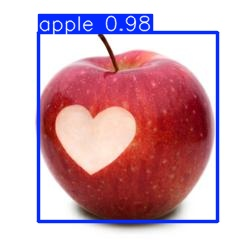

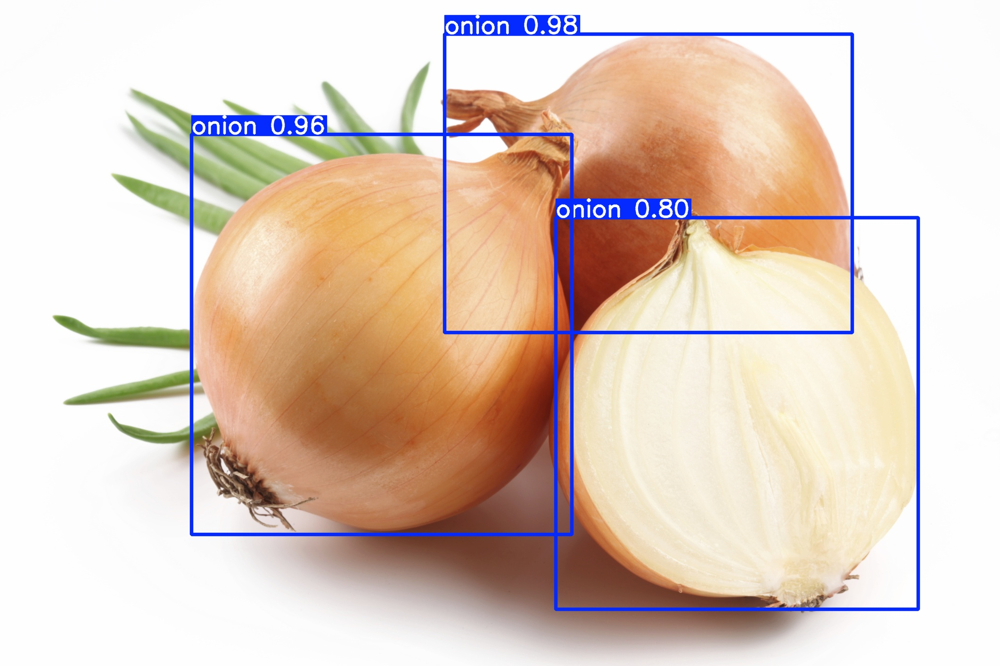

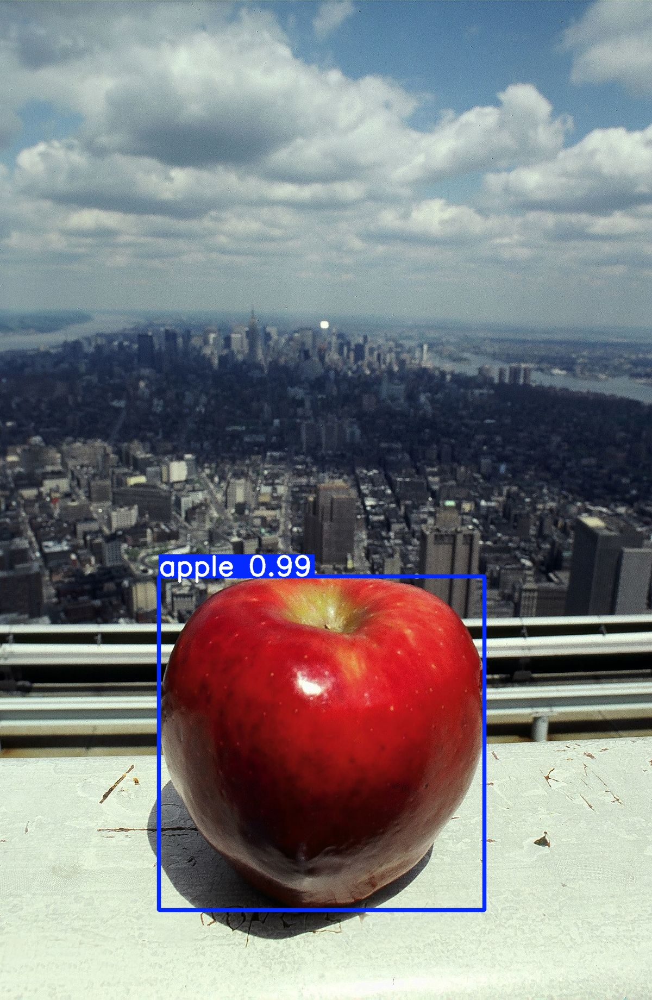

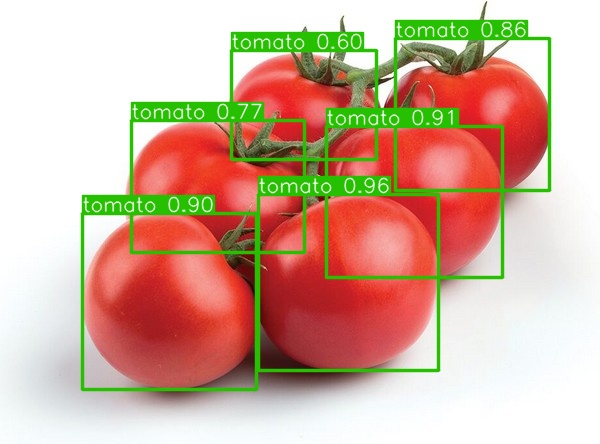

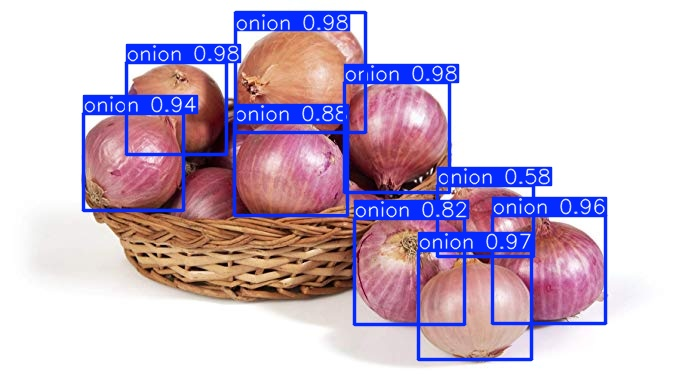

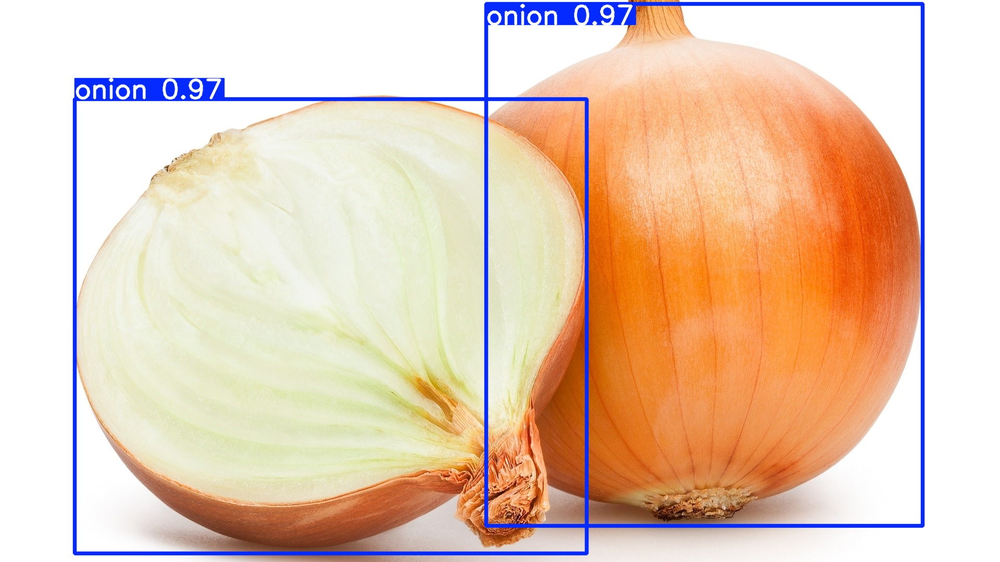

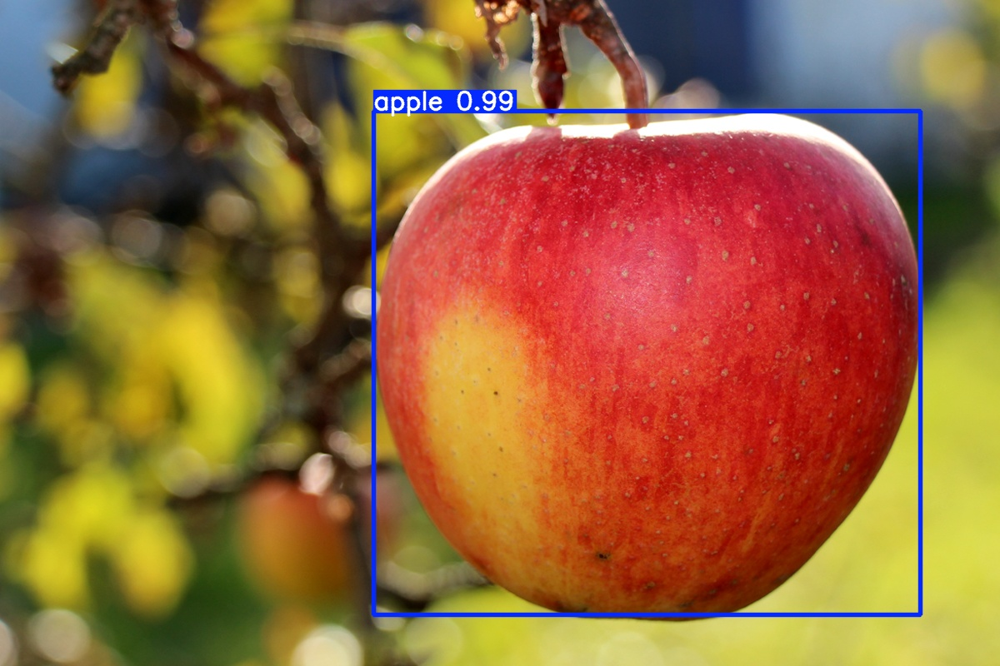

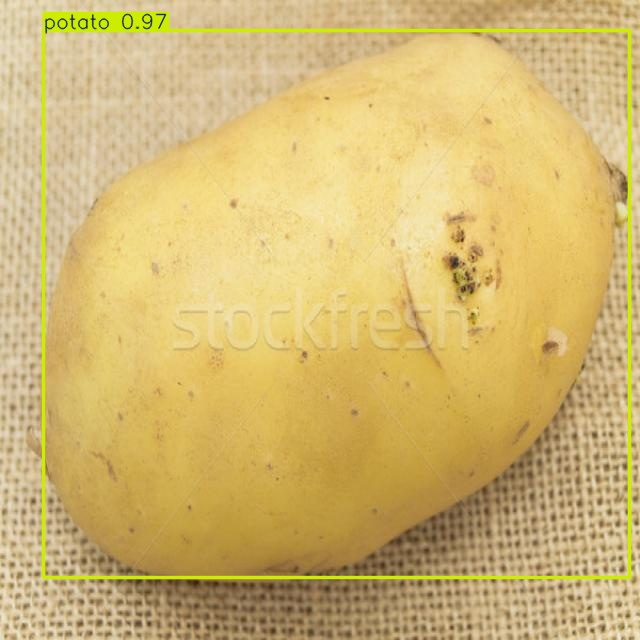

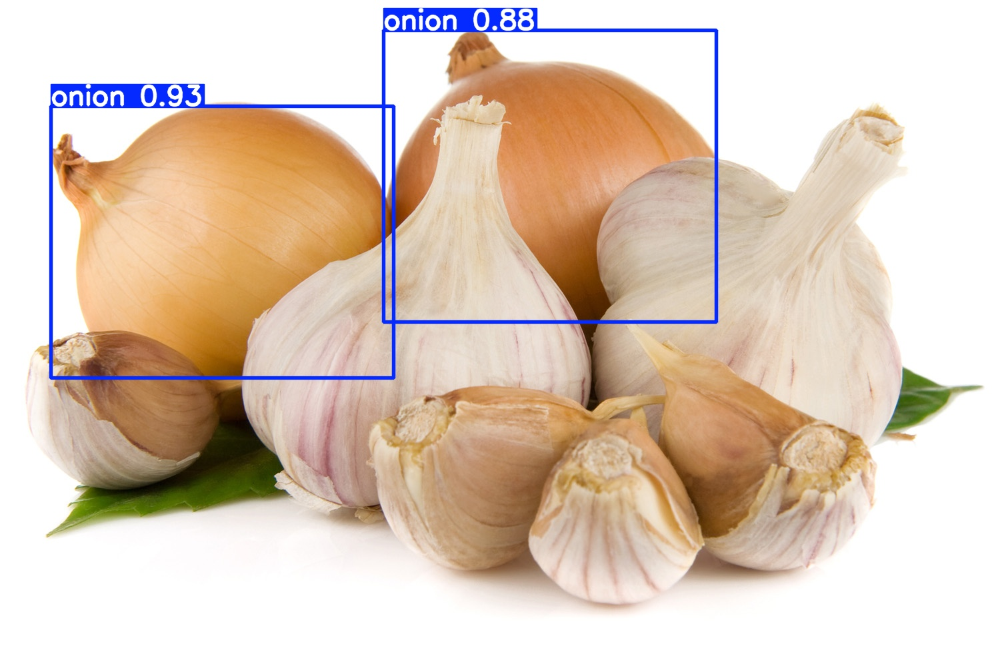

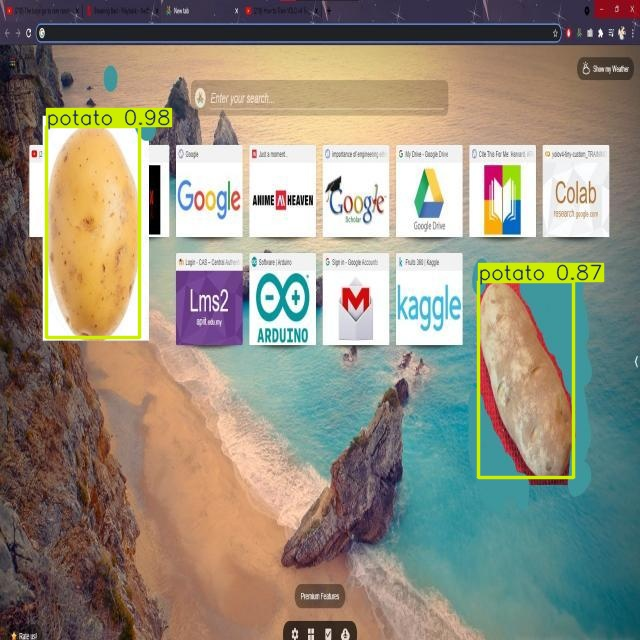

In [ ]:
import glob
from IPython.display import Image, display
for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg')[:10]:
  display(Image(filename=image_path, height=400))
  print('\n')

Run validation on the trained model to evaluate its performance using mAP metrics across all classes.

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n.pt")  # load an official model
model = YOLO("/content/gdrive/MyDrive/yolov11n_project/train/weights/best.pt")  # load a custom model

# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map  # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps  # a list contains map50-95 of each category

Ultralytics 8.3.139 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,589,172 parameters, 0 gradients, 6.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2483.1±1064.1 MB/s, size: 255.1 KB)


val: Scanning /content/data/validation/labels.cache... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<?, ?it/s]

val: /content/data/validation/images/6ea2f9d5-Image_50.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.84it/s]


                   all         70        211      0.889      0.816      0.939       0.76
                 apple         19         48      0.876       0.75      0.859      0.608
                banana          7         14       0.76          1      0.995      0.823
                 lemon          7         18      0.883      0.833      0.951      0.799
                 onion         18         91      0.899      0.725       0.89      0.652
                potato          7         13          1      0.738       0.98      0.905
                tomato         12         27      0.916      0.852      0.958      0.774
Speed: 2.4ms preprocess, 14.2ms inference, 0.0ms loss, 5.7ms postprocess per image
Results saved to runs/detect/val


array([    0.60799,     0.82305,     0.76026,     0.76026,     0.76026,     0.76026,     0.76026,     0.76026,     0.76026,     0.76026,     0.76026,     0.76026,     0.76026,     0.76026,     0.76026,     0.76026,     0.76026,     0.76026,     0.79907,     0.76026,     0.65239,     0.76026,     0.76026,     0.76026,
           0.76026,     0.76026,     0.76026,     0.90526,     0.76026,     0.76026,     0.76026,     0.76026,     0.76026,     0.77381,     0.76026,     0.76026])

#6.&nbsp;Deploy Model

Now that your custom model has been trained, it's ready for download and deployment in real-world applications. YOLO models are highly versatile and can run on PCs, embedded platforms, and mobile devices. Ultralytics provides tools to convert models to formats like tflite and onnx for deployment in diverse environments.

This section explains how to download your trained model and includes guidance for deploying it on edge devices such as the **SAMA7D65 Curiosity Board**

## 6.1 Conversion of PyTorch to ONNX Model

In [ ]:
from ultralytics import YOLO

# Load the YOLO11 model
model = YOLO("/content/gdrive/MyDrive/yolov11n_project/train/weights/best.pt")

# Export the model to ONNX format
model.export(format="onnx")  # creates 'yolo11n.onnx'



Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.145 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel CPUs. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLO11n summary (fused): 100 layers, 2,589,172 parameters, 0 gradients, 6.4 GFLOPs

PyTorch: starting from '/content/gdrive/MyDrive/yolov11n_project/train/weights/best.pt' with input shape (1, 3, 320, 320) BCHW and output shape(s) (1, 40, 2100) (5.2 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<1.18.0', 'onnxslim>=0.1.53', 'onnxruntime'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 2.0s
WARNING ⚠️ requirements: Restart runtime 

'/content/gdrive/MyDrive/yolov11n_project/train/weights/best.onnx'

Required packages for onnx2tf conversion

In [ ]:
!pip install onnx2tf
!pip install onnx-graphsurgeon
!pip install ai_edge_litert
!pip install sng4onnx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.2/149.2 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 448.0/448.0 kB 26.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.9/57.9 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 118.8 MB/s eta 0:00:00


In [ ]:
!onnx2tf -i /content/gdrive/MyDrive/yolov11n_project/train/weights/best.onnx --b 1

E0000 00:00:1748360222.621932    8379 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748360222.631472    8379 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered

Model optimizing started ============================================================
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/onnx2tf/onnx2tf.py", line 668, in convert
    result = subprocess.check_output(
             ^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.11/subprocess.py", line 466, in check_output
    return run(*popenargs, stdout=PIPE, timeout=timeout, check=True,
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.11/subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  Fi

## 6.2 Quantising the Model For Edge Deployment

Randomly sample 200 images for calibration.
Store in a new directory


In [ ]:
import os
import random
import shutil

# Paths
source_dir = "/content/data/train/images"
calib_dir = "/content/calibration_images"
num_images = 200  # Change this number depending on your calibration needs

# Create target folder
os.makedirs(calib_dir, exist_ok=True)

# Get all image filenames
image_files = [f for f in os.listdir(source_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
selected_files = random.sample(image_files, min(num_images, len(image_files)))

# Copy selected files
for file in selected_files:
    shutil.copy(os.path.join(source_dir, file), os.path.join(calib_dir, file))

print(f"✅ Copied {len(selected_files)} images to {calib_dir}")

✅ Copied 200 images to /content/calibration_images


This function defines the representative dataset generator required for post-training quantization of the YOLO model. It loads calibration images, resizes and normalizes them, and yields them in the correct format for use during TFLite model conversion.


In [ ]:
import cv2
import numpy as np
import os

calib_dir = "/content/calibration_images"
calib_images = sorted(os.listdir(calib_dir))

def representative_dataset_gen():
    for img_name in calib_images:  # List of calibration images
        img_path = os.path.join(calib_dir, img_name)
        img = cv2.imread(image_path)
        img = cv2.resize(img, (320, 320))
        img = img.astype(np.float32) / 255.0  # Normalize to [0,1] if needed
        img = np.expand_dims(img, axis=0)  # Shape (1,320,320,3)
        yield [img]


The following code converts a TensorFlow SavedModel to a fully integer-quantized TensorFlow Lite model using a representative dataset for calibration. This optimization reduces model size and improves inference efficiency on edge devices that support INT8 operations.









In [ ]:
import tensorflow as tf
# Load your TensorFlow model
model = tf.saved_model.load('/content/saved_model')  # Assuming you exported to SavedModel first

# Create TFLite Converter
converter = tf.lite.TFLiteConverter.from_saved_model('/content/saved_model')
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.representative_dataset = representative_dataset_gen

# Set fully integer quantization
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]

# Important: ensure input/output are int8
converter.inference_input_type = tf.int8
converter.inference_output_type = tf.int8

# Convert
tflite_quant_model = converter.convert()

# Save the TFLite model
with open('yolov11n_int8.tflite', 'wb') as f:
    f.write(tflite_quant_model)

OSError: SavedModel file does not exist at: /content/saved_model/{saved_model.pbtxt|saved_model.pb}

## 6.3 Running Inference on the TFLite Model

This code loads a TensorFlow Lite model and performs inference on all images in the prediction folder. It preprocesses each image by resizing and normalizing it to match the model’s expected input shape, runs the inference, and prints the output tensor shape. The resized images are saved separately for visualization or further processing.



In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf

# Load TFLite model
interpreter = tf.lite.Interpreter(model_path="/content/saved_model/best_float16.tflite")
interpreter.allocate_tensors()

# Get input and output details
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

input_shape = input_details[0]['shape']  # e.g., [1, 320, 320, 3]
print("Model expects input shape:", input_shape)

# Paths
image_dir = "/content/runs/detect/predict/"
resized_dir = "/content/resized_images"
os.makedirs(resized_dir, exist_ok=True)

# Supported formats
image_extensions = (".jpg", ".jpeg", ".png")

# Loop over images
for filename in os.listdir(image_dir):
    if filename.lower().endswith(image_extensions):
        input_path = os.path.join(image_dir, filename)
        output_path = os.path.join(resized_dir, filename)

        # Load and preprocess image
        img = cv2.imread(input_path)
        img_resized = cv2.resize(img, (input_shape[2], input_shape[1]))  # Width x Height
        img_rgb = cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)
        img_norm = img_rgb.astype(np.float32) / 255.0
        input_tensor = np.expand_dims(img_norm, axis=0)

        # Run inference
        interpreter.set_tensor(input_details[0]['index'], input_tensor)
        interpreter.invoke()
        output_data = interpreter.get_tensor(output_details[0]['index'])

        print(f"[{filename}] Output shape:", output_data.shape)
        # Optionally: decode predictions here (e.g., NMS, thresholding)

        # Save resized image
        cv2.imwrite(output_path, img_resized)
                # Postprocess YOLO-style output
        def sigmoid(x):
            return 1 / (1 + np.exp(-x))

        pred = np.squeeze(output_data)  # shape: (40, 8400)
        pred = np.transpose(pred, (1, 0))  # shape: (8400, 40)

        boxes = []
        scores = []
        class_ids = []

        for det in pred:
            x, y, w, h = det[:4]
            conf = sigmoid(det[4])
            class_confs = sigmoid(det[5:])
            class_id = np.argmax(class_confs)
            score = conf * class_confs[class_id]

            if score > 0.3:  # Confidence threshold
                # Convert from center x,y,w,h to x1,y1,x2,y2
                x1 = int((x - w / 2) * img.shape[1])
                y1 = int((y - h / 2) * img.shape[0])
                x2 = int((x + w / 2) * img.shape[1])
                y2 = int((y + h / 2) * img.shape[0])
                boxes.append([x1, y1, x2 - x1, y2 - y1])
                scores.append(float(score))
                class_ids.append(class_id)

        # Apply NMS
        indices = cv2.dnn.NMSBoxes(boxes, scores, score_threshold=0.3, nms_threshold=0.5)

        for i in indices:
            i = i[0] if isinstance(i, (list, np.ndarray)) else i
            box = boxes[i]
            x, y, w, h = box
            cv2.rectangle(img_resized, (x, y), (x + w, y + h), (0, 255, 0), 2)
            label = f"{class_ids[i]}: {scores[i]:.2f}"
            cv2.putText(img_resized, label, (x, y - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

        # Save visualization
        vis_path = os.path.join(resized_dir, f"vis_{filename}")
        cv2.imwrite(vis_path, img_resized)



Model expects input shape: [  1 320 320   3]
[0958d7b2-Image_16.jpg] Output shape: (1, 40, 2100)
[6f77ca15-Image_2.jpg] Output shape: (1, 40, 2100)
[b004e4a0-Image_19.jpg] Output shape: (1, 40, 2100)
[3123e073-Image_59.jpg] Output shape: (1, 40, 2100)
[c7086a1b-Image_24.jpg] Output shape: (1, 40, 2100)
[d995704a-Image_11.jpg] Output shape: (1, 40, 2100)
[e54ca6cd-Image_40.jpg] Output shape: (1, 40, 2100)
[12_jpg.rf.c49489340018e69ba9db62c3bbb33ac8.jpg] Output shape: (1, 40, 2100)
[8e6d3742-Image_12.jpg] Output shape: (1, 40, 2100)
[99_jpg.rf.2261515854d45fa31971c0dfec446667.jpg] Output shape: (1, 40, 2100)
[2578fee4-Image_90.jpg] Output shape: (1, 40, 2100)
[t21_jpeg.rf.063c6c7eb9f1133a9c902911cb1a3b9f.jpg] Output shape: (1, 40, 2100)
[edc04a83-Image_28.jpg] Output shape: (1, 40, 2100)
[fruit_output_503_png.rf.f14e340026c0056f016cedbdfc5e0c46.jpg] Output shape: (1, 40, 2100)
[34ea929c-Image_86.jpg] Output shape: (1, 40, 2100)
[5041672c-Image_84.jpg] Output shape: (1, 40, 2100)
[0bd33f6

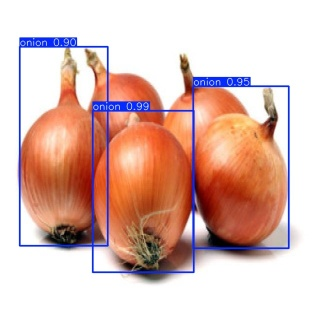

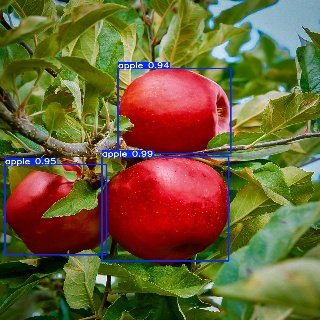

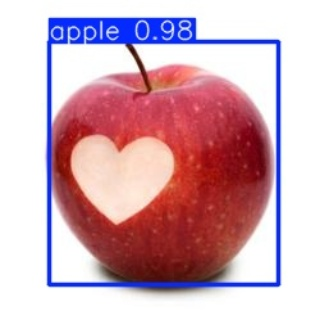

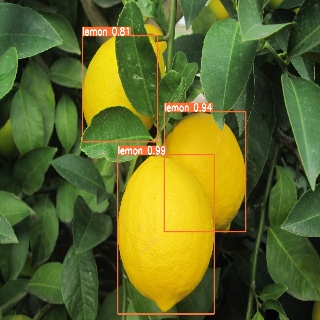

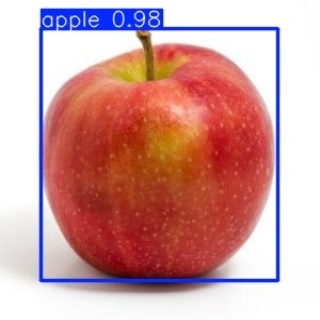

...

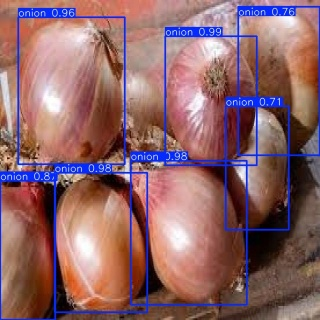

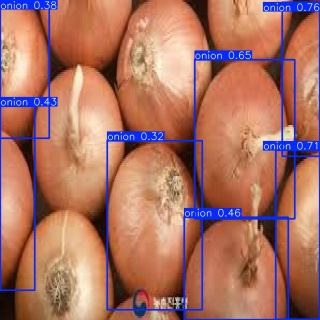

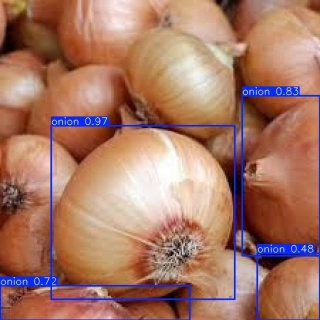

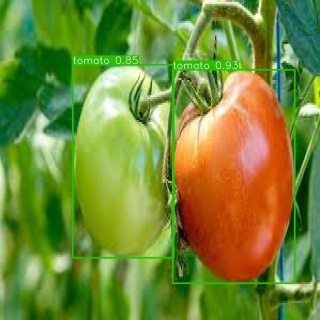

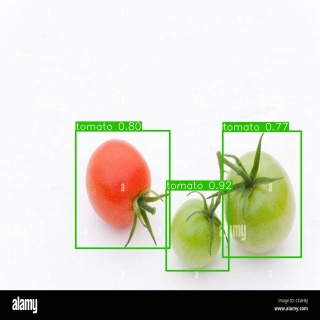

In [ ]:
from IPython.display import display
from PIL import Image

# Display first 5 visualized outputs
for fname in sorted(os.listdir(resized_dir)):
    if fname.startswith("vis_"):
        img_path = os.path.join(resized_dir, fname)
        display(Image.open(img_path))
